In [1]:
#import packages
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import numpy as np
import scipy.stats as ss
pd.set_option('display.max_columns', None)
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import time
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import cross_val_score, GridSearchCV
from wordcloud import WordCloud
from PIL import Image
from sklearn.metrics import balanced_accuracy_score, roc_curve, confusion_matrix, accuracy_score, auc

In [2]:
data = pd.read_csv('C:\\Users\\gianl\\Capstone2\\data\Real_fake_news_DWed.csv')
data.head(2)

,date,text,title,Real_Fake,Cat_Government News,Cat_Middle-east,Cat_News,Cat_US_News,Cat_left-news,Cat_politics,Cat_politicsNews,Cat_worldnews,sent_title,sent_text,words_in_title,char_title,words_in_text,char_text,Count_words_title,Poly_syllables_title,Complex_words_title,Complex_words_text,Long_words_title,Flesh_Kin_Grade_title,smog_title,Gunning_fox_title,CLI_title,ARI_title,LIX_title,Gulpease_title,Flesh_Kin_Grade_text,Flesh_Read_easy_text,CLI_text,Gulpease_text,title_nlp,text_nlp,title_nlp_stem,text_nlp_stem,title_nlp_lem,text_nlp_lem
0,2015-03-31,the irony here is not lost on us. hillary is ...,hillary rodham nixon: a candidate with more b...,1,0,0,0,0,1,1,0,0,1,17,hillary rodham nixon a candidate with more ba...,64,the irony here is not lost on us hillary is b...,1626,12,7,0,21,5,11.706667,15.226696,4.8,-15.511067,9.6900,53.666667,60.666667,11.555195,45.639607,-15.516060,54.015674,"['hillary', 'rodham', 'nixon', 'candidate', 'b...","['irony', 'lost', 'us', 'hillary', 'compared',...","['hillari', 'rodham', 'nixon', 'candid', 'bagg...","['ironi', 'lost', 'us', 'hillari', 'compar', '...","['hillary', 'rodham', 'nixon', 'candidate', 'b...","['irony', 'lose', 'us', 'hillary', 'compare', ..."
1,2015-03-31,"in case you missed it sen. harry reid (r-nv),...",watch dirty harry reid on his lie about romne...,1,0,0,0,0,1,1,0,0,1,8,watch dirty harry reid on his lie about romne...,60,in case you missed it sen harry reid nv who a...,500,16,4,0,3,0,5.400000,11.573499,6.4,-15.598000,4.2325,16.000000,70.250000,5.736189,81.098873,-15.578426,67.688525,"['watch', 'dirty', 'harry', 'reid', 'lie', 'ro...","['case', 'missed', 'sen', 'harry', 'reid', 'nv...","['watch', 'dirti', 'harri', 'reid', 'lie', 'ro...","['case', 'miss', 'sen', 'harri', 'reid', 'nv',...","['watch', 'dirty', 'harry', 'reid', 'lie', 'ro...","['case', 'miss', 'sen', 'harry', 'reid', 'nv',..."


# REMOVAL OF COLLINEAR FEATURES: Variance inflation factor analysis

In [3]:
# During data wrangling all highly correlated features were taken care of.
# last thing to do is to reduce collinearity using VIF 

In [4]:
# extracting data 
data_for_VIF = data[['sent_title', 'char_title', 'CLI_title', 'Count_words_title', 'Poly_syllables_title', 'Complex_words_title', 'Long_words_title', 'Flesh_Kin_Grade_title', 'smog_title', 'Gunning_fox_title','ARI_title', 'LIX_title', 'Gulpease_title','sent_text','char_text', 'Complex_words_text',  'Flesh_Kin_Grade_text', 'Flesh_Read_easy_text', 'CLI_text', 'Gulpease_text']]
data_for_VIF = add_constant(data_for_VIF)

print(data_for_VIF.shape)
data_for_VIF.head(2)

(38577, 21)


,const,sent_title,char_title,CLI_title,Count_words_title,Poly_syllables_title,Complex_words_title,Long_words_title,Flesh_Kin_Grade_title,smog_title,Gunning_fox_title,ARI_title,LIX_title,Gulpease_title,sent_text,char_text,Complex_words_text,Flesh_Kin_Grade_text,Flesh_Read_easy_text,CLI_text,Gulpease_text
0,1.0,1,64,-15.511067,12,7,0,5,11.706667,15.226696,4.8,9.6900,53.666667,60.666667,17,1626,21,11.555195,45.639607,-15.516060,54.015674
1,1.0,1,60,-15.598000,16,4,0,0,5.400000,11.573499,6.4,4.2325,16.000000,70.250000,8,500,3,5.736189,81.098873,-15.578426,67.688525


In [5]:
# writing a loop to remove collinear features with VIF>10
while True:
    VIF = [variance_inflation_factor(data_for_VIF.values, i) for i in range(data_for_VIF.shape[1])]
    VIF = pd.Series(VIF, index=data_for_VIF.columns).sort_values(ascending = False)
    if VIF.index[0] == 'const' and VIF[1] >=10:
        to_drop = VIF.index[1]
    elif VIF.index[0] != 'const' and VIF[0] >=10: 
        to_drop = VIF.index[0]
    else:
        break
    data_for_VIF.drop(to_drop, inplace = True, axis = 1)
    data.drop(to_drop, inplace = True, axis = 1)

    
# remove the const columns
data_for_VIF.drop('const', inplace = True, axis = 1)
    
# make a list of the remaining features. This may come handy later     
to_keep = VIF.index
to_keep = to_keep.tolist()
to_keep.remove('const')
print(to_keep)

['Gulpease_title', 'Flesh_Kin_Grade_title', 'ARI_title', 'smog_title', 'sent_text', 'Complex_words_text', 'CLI_text', 'sent_title', 'Gulpease_text', 'Flesh_Kin_Grade_text', 'Long_words_title', 'Count_words_title', 'Complex_words_title']


In [6]:
# Save the new dataframe 
data.to_csv('C:\\Users\\gianl\\Capstone2\\data\Real_fake_news_EDAed.csv')

## Correlation table of the remaining features 

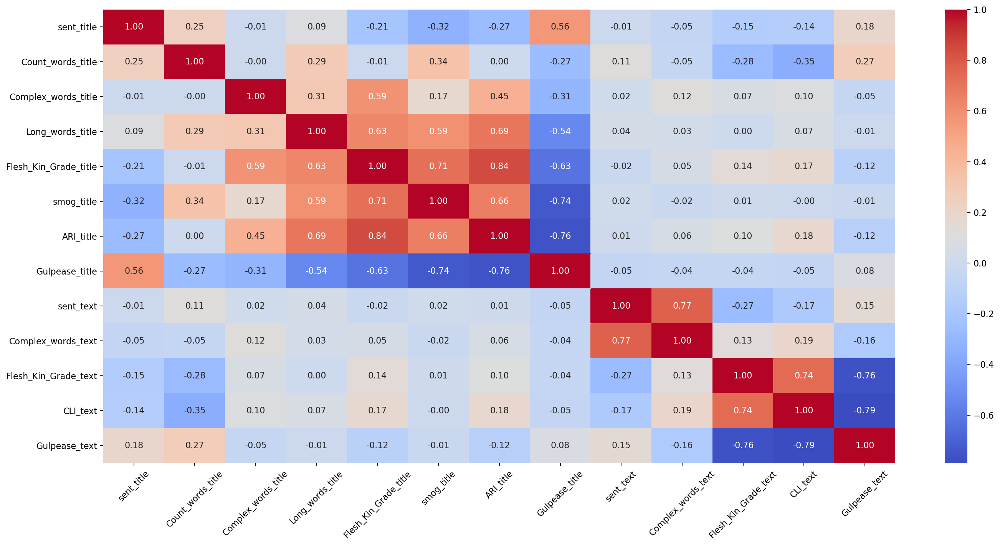

In [7]:
corr_title = data_for_VIF.corr()
plt.figure(figsize=(18,9), dpi=160)
sns.heatmap(corr_title, cmap=plt.get_cmap('coolwarm'), annot =True, fmt='.2f')
plt.xticks(rotation = 45)
plt.tight_layout()
plt.savefig('C:\\Users\\gianl\\Capstone2\\figures\\data_linguistic.tiff');

In [8]:
# There is moderate correlation between some feature. 
# But, since all VIF scores are below 10, we should still be able to reasonably trust our coefficients.

# Classes (Real_fake) distribution

In [9]:
classes = data['Real_Fake'].value_counts(normalize = True)
classes

0    0.549291
1    0.450709
Name: Real_Fake, dtype: float64

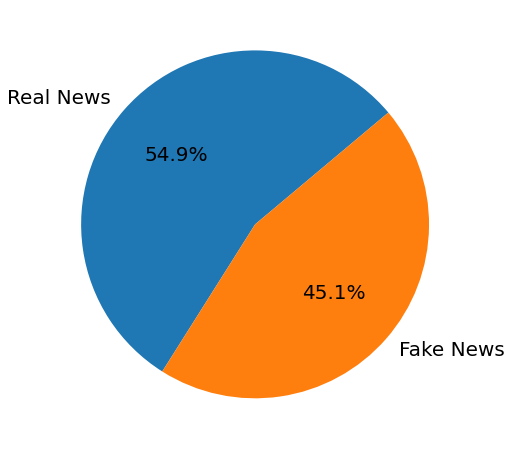

In [10]:
classes.index = ['Real News', 'Fake News']
plt.figure(figsize = (8,8))
classes.plot(kind='pie', label='', startangle = 40, fontsize=20, autopct='%1.1f%%')
plt.savefig('C:\\Users\\gianl\\Capstone2\\figures\\pie_chart.tiff')

In [11]:
# Conclusion: the two classes are balanced 

# News categories distribution 

In [12]:
# Let's check how the categories below are distributed among real and fake news 
data_cat = data[['Real_Fake', 'Cat_Government News',
       'Cat_Middle-east', 'Cat_News', 'Cat_US_News', 'Cat_left-news',
       'Cat_politics', 'Cat_politicsNews', 'Cat_worldnews']]

data_cat = data_cat.groupby('Real_Fake').sum()
data_cat.index = ['Real News', 'Fake News']


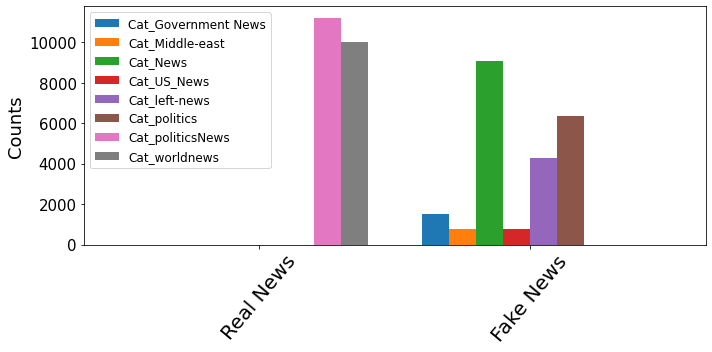

In [13]:
data_cat.plot(kind= 'bar', width = 0.8, figsize = (10,5))
plt.xticks(fontsize =20, rotation = 50)
plt.legend(loc= 2, prop={'size': 12})
plt.ylabel('Counts', fontsize =18)
plt.yticks(fontsize = 15)
plt.tight_layout()
plt.savefig('C:\\Users\\gianl\\Capstone2\\figures\\categorie_news.tiff')
plt.show()

In [14]:
# conclusion: dichotomic distributions. We won't used them for the prediction

# Check hyperlinks tokens distribution 

In [15]:
data['Facebook'] = data['words_in_text'].str.count('facbooolink')
data['twitterlink'] = data['words_in_text'].str.count('twitterlink')
data['youtubelink'] = data['words_in_text'].str.count('youtubelink')
data['bitlyylinkk'] = data['words_in_text'].str.count('bitlyylinkk')
data['tmsnrtlinnk'] = data['words_in_text'].str.count('tmsnrtlinnk')

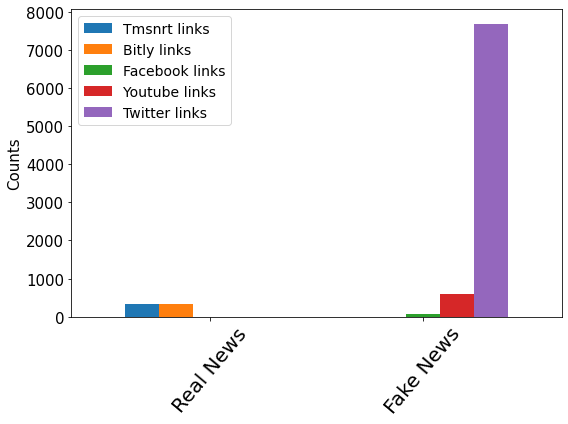

In [16]:
links = data.groupby('Real_Fake')[['tmsnrtlinnk', 'bitlyylinkk','Facebook','youtubelink','twitterlink', ]].sum()
links.index = ['Real News', 'Fake News']
links.columns = ['Tmsnrt links', 'Bitly links',  'Facebook links', 'Youtube links', 'Twitter links' , ]

links.plot(kind = 'bar', width = 0.8, figsize = (8,6))
plt.xticks(fontsize =20, rotation = 50)
plt.legend(loc= 2,prop={'size': 14} )
#plt.yscale('log')
#plt.ylim(1, 100000)
plt.ylabel('Counts', fontsize =15)
plt.yticks(fontsize = 15)
plt.tight_layout()
plt.savefig('C:\\Users\\gianl\\Capstone2\\figures\\links_news.tiff')
plt.show()

# Number of sentence in title

In [17]:
plt.rcParams['figure.figsize'] = (28, 14)
plt.rcParams['font.size'] =24

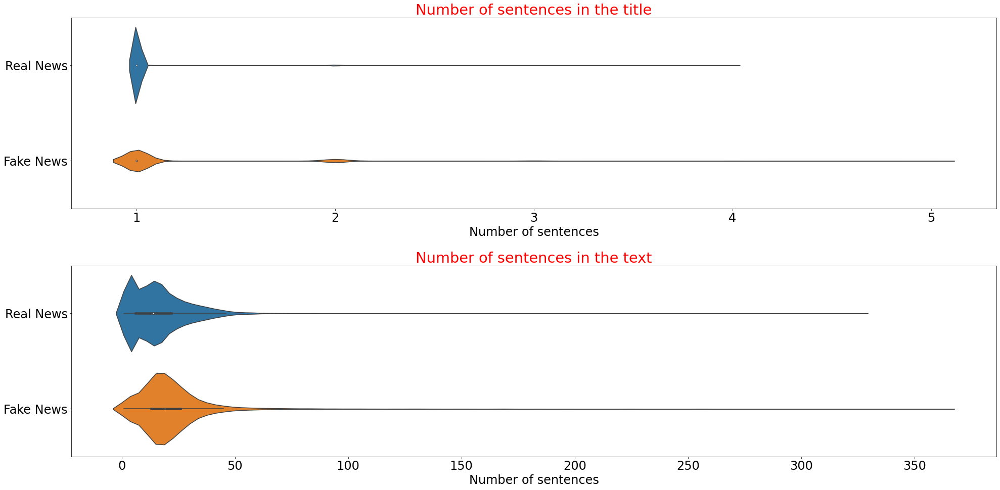

sent_title                                              sent_text  \
               count      mean       std  min  25%  50%  75%  max     count   
Real_Fake                                                                     
0            21190.0  1.016848  0.135839  1.0  1.0  1.0  1.0  4.0   21190.0   
1            17387.0  1.158222  0.416758  1.0  1.0  1.0  1.0  5.0   17387.0   

                                                               
                mean        std  min   25%   50%   75%    max  
Real_Fake                                                      
0          16.315621  12.696594  1.0   6.0  14.0  22.0  326.0  
1          21.348364  16.729373  1.0  13.0  19.0  26.0  363.0

In [18]:
plt.subplot(2, 1 , 1)
ax = sns.violinplot(y = 'Real_Fake', x ='sent_title', data = data, orient = 'h')
plt.title('Number of sentences in the title', c ='red')
plt.xlabel('Number of sentences')
ax.set_yticklabels(['Real News','Fake News'])
plt.ylabel('')

plt.subplot(2, 1 , 2)
ax = sns.violinplot(y = 'Real_Fake', x ='sent_text', data = data, orient = 'h')
plt.title('Number of sentences in the text', c ='red')
plt.ylabel('')
plt.xlabel('Number of sentences')
ax.set_yticklabels(['Real News','Fake News'])
plt.tight_layout()
plt.savefig('C:\\Users\\gianl\\Capstone2\\figures\\Number_sentence_7_23.tiff', dpi =120)
plt.show()

data.groupby('Real_Fake')[['sent_title', 'sent_text']].describe()

In [19]:
# t test for number of sent_title
ss.ttest_ind(data[data['Real_Fake']==0]['sent_title'] ,  data[data['Real_Fake']==1]['sent_title'], equal_var = False )

Ttest_indResult(statistic=-42.899153401970736, pvalue=0.0)

In [20]:
# t test for number of sent_text
ss.ttest_ind(data[data['Real_Fake']==0]['sent_text'] ,  data[data['Real_Fake']==1]['sent_text'], equal_var = False )

Ttest_indResult(statistic=-32.68832061239588, pvalue=1.4872550542704963e-230)

# Number of words in title

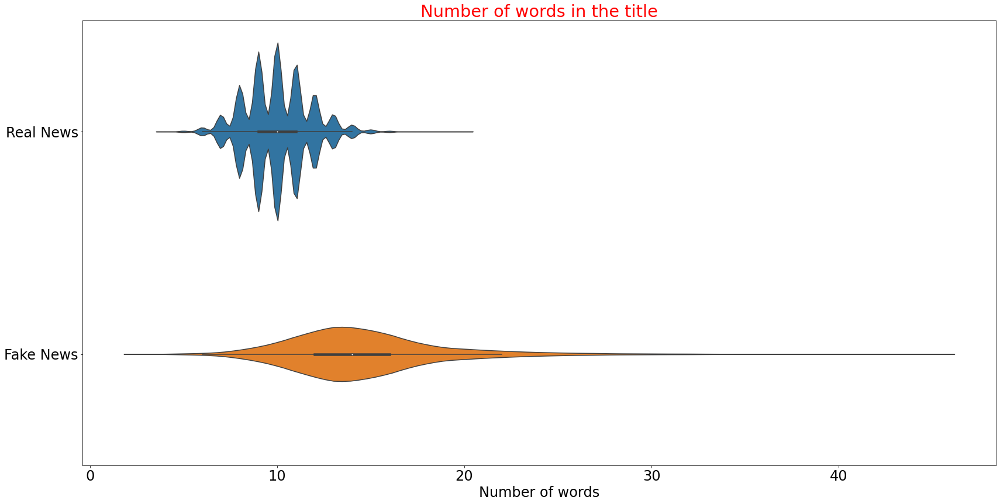

Count_words_title                                                  
                      count       mean       std  min   25%   50%   75%   max
Real_Fake                                                                    
0                   21190.0   9.992591  1.703822  4.0   9.0  10.0  11.0  20.0
1                   17387.0  14.591706  4.178096  3.0  12.0  14.0  16.0  45.0

In [21]:
ax = sns.violinplot(y = 'Real_Fake', x ='Count_words_title', data = data, orient = 'h')
plt.title('Number of words in the title', c ='red')
plt.xlabel('Number of words')
ax.set_yticklabels(['Real News','Fake News'])
plt.ylabel('')
plt.savefig('C:\\Users\\gianl\\Capstone2\\figures\\words_in_title_7_23.tiff', dpi =120)
plt.show()

data.groupby('Real_Fake')[['Count_words_title']].describe()

In [22]:
# t test for number of words in title
ss.ttest_ind(data[data['Real_Fake']==0]['Count_words_title'] ,  data[data['Real_Fake']==1]['Count_words_title'], equal_var = False )

Ttest_indResult(statistic=-136.15460769465557, pvalue=0.0)

# Number of complex words in the text

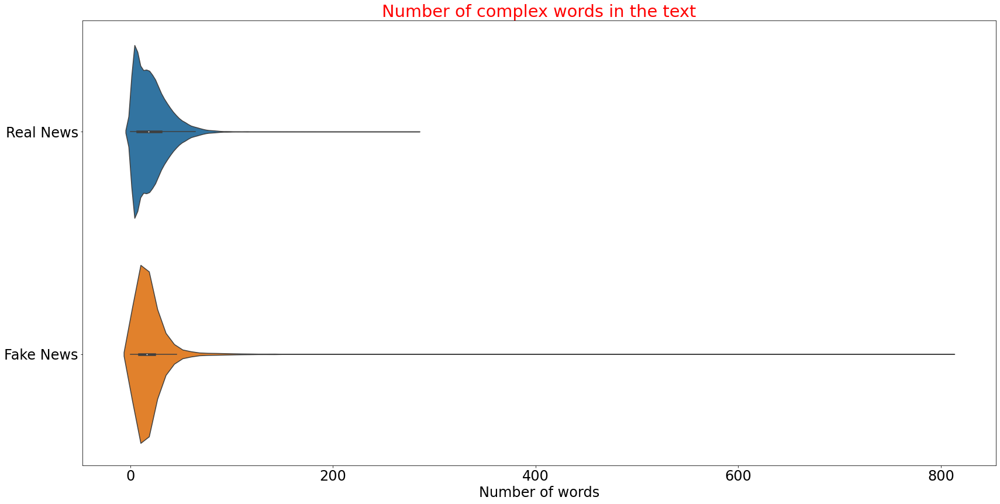

Complex_words_text                                              \
                       count       mean        std  min  25%   50%   75%   
Real_Fake                                                                  
0                    21190.0  21.088438  16.973947  0.0  7.0  18.0  30.0   
1                    17387.0  19.700466  22.526572  0.0  9.0  16.0  24.0   

                  
             max  
Real_Fake         
0          281.0  
1          807.0

In [23]:
ax = sns.violinplot(y = 'Real_Fake', x ='Complex_words_text', data = data, orient = 'h')
plt.title('Number of complex words in the text', c ='red')
plt.xlabel('Number of words')
ax.set_yticklabels(['Real News','Fake News'])
plt.ylabel('')
plt.savefig('C:\\Users\\gianl\\Capstone2\\figures\\complex_words_in_text_7_23.tiff', dpi =120)
plt.show()

data.groupby('Real_Fake')[['Complex_words_text']].describe()

In [24]:
# t test for number of complex words in title
ss.ttest_ind(data[data['Real_Fake']==0]['Complex_words_text'] ,  data[data['Real_Fake']==1]['Complex_words_text'], equal_var = False )

Ttest_indResult(statistic=6.710417078915997, pvalue=1.9733174055192837e-11)

# Number of long words in title

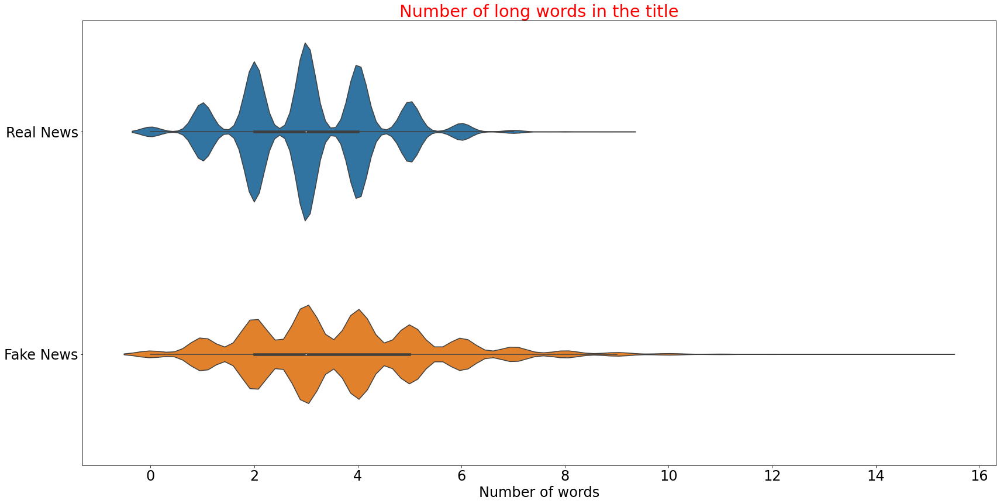

Long_words_title                                              
                     count      mean       std  min  25%  50%  75%   max
Real_Fake                                                               
0                  21190.0  3.063615  1.319402  0.0  2.0  3.0  4.0   9.0
1                  17387.0  3.670041  1.818840  0.0  2.0  3.0  5.0  15.0

In [25]:
ax = sns.violinplot(y = 'Real_Fake', x ='Long_words_title', data = data, orient = 'h')
plt.title('Number of long words in the title', c ='red')
plt.xlabel('Number of words')
ax.set_yticklabels(['Real News','Fake News'])
plt.ylabel('')
plt.savefig('C:\\Users\\gianl\\Capstone2\\figures\\long_words_in_title_7_23.tiff', dpi =120)
plt.show()

data.groupby('Real_Fake')[['Long_words_title']].describe()

# Flesh Kincaid Grade in title and text

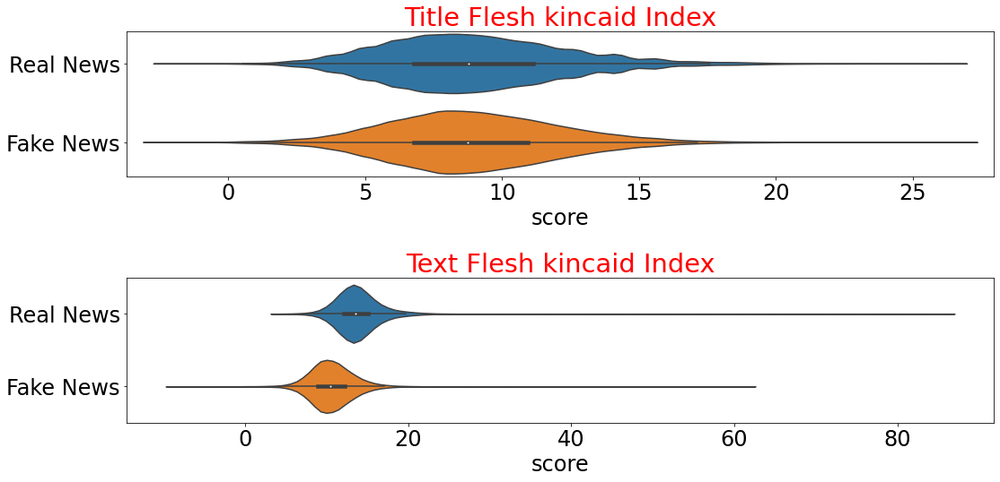

Flesh_Kin_Grade_title                                           \
                          count      mean      std   min   25%       50%   
Real_Fake                                                                  
0                       21190.0  9.023908  3.31667 -1.84  6.79  8.780000   
1                       17387.0  8.967654  3.13508 -2.23  6.79  8.756667   

                                Flesh_Kin_Grade_text                       \
                 75%        max                count       mean       std   
Real_Fake                                                                   
0          11.130000  26.083333              21190.0  13.819786  3.119119   
1          10.941429  26.480000              17387.0  10.647373  2.807791   

                                                                 
                min        25%        50%        75%        max  
Real_Fake                                                        
0          4.000467  12.090985  13.556602  15.146502  86.172397  
1         -8.910000   8.934949  10.465147  12.192902  61.801875

In [26]:
plt.figure(figsize =(16,8))
plt.subplot(2,1,1),
ax = sns.violinplot(x = 'Flesh_Kin_Grade_title', y = 'Real_Fake', data = data, orient ='h')
ax.set_yticklabels(['Real News','Fake News'])
plt.title('Title Flesh kincaid Index', c ='red' )
plt.xlabel('score')
plt.ylabel('')
plt.margins(0.02)
plt.subplot(2,1,2)
ax = sns.violinplot(x = 'Flesh_Kin_Grade_text', y = 'Real_Fake', data = data, orient ='h')
ax.set_yticklabels(['Real News','Fake News'])
plt.title('Text Flesh kincaid Index', c ='red' )
plt.xlabel('score')
plt.ylabel('')
plt.tight_layout()
plt.savefig('C:\\Users\\gianl\\Capstone2\\figures\\Flesh_Kin_Grade_swarm_plot.tiff',dpi =120)
plt.show()


data.groupby('Real_Fake')[['Flesh_Kin_Grade_title', 'Flesh_Kin_Grade_text']].describe()

In [27]:
# T test for the title  
ss.ttest_ind(data[data['Real_Fake'] == 0]['Flesh_Kin_Grade_title'], data[data['Real_Fake'] == 1]['Flesh_Kin_Grade_title'], equal_var = False)

Ttest_indResult(statistic=1.7082565976746065, pvalue=0.08759694800430634)

In [28]:
# T test for the text  
ss.ttest_ind(data[data['Real_Fake'] == 0]['Flesh_Kin_Grade_text'], data[data['Real_Fake'] == 1]['Flesh_Kin_Grade_text'])

Ttest_indResult(statistic=103.93821437876746, pvalue=0.0)

In [29]:
# T test for the text  
ss.ttest_ind(data[data['Real_Fake'] == 0]['Flesh_Kin_Grade_text'], data[data['Real_Fake'] == 1]['Flesh_Kin_Grade_text'])

Ttest_indResult(statistic=103.93821437876746, pvalue=0.0)

In [30]:
# retriving example of new's text
print(data[(data['Flesh_Kin_Grade_text'] <4.1) & (data['Real_Fake'] == 0 ) ]['words_in_text'].values)
print(data[(data['Flesh_Kin_Grade_text'] <-1) & (data['Real_Fake'] == 1 )]['words_in_text'].values)

[' washington reuters here are some of the highlights of the reuters interview with usa president donald trump on thursday there a chance that we could end up having a major major conflict with north korea absolutely question is that your biggest global worry at this point yes i would say that is true yes north korea would be certainly that on getting south korea to pay for thaad missile defense system on the thaad system it is about a billion dollars i said why are we paying why are we paying a billion dollars we are protecting why are we paying a billion dollars so i informed south korea it would be appropriate if they paid nobody going to do that why are we paying a billion dollars it is a billion dollar system it is phenomenal it is the most incredible equipmenyu have ever seen shoots missiles right out of the sky and it protects them and i want to protect them we are going to protect them but they should pay for that and they understand that on whether the war against islamist ext

In [31]:
# retriving text of real and fake news with highest Flesh_Kin_Grade
print('Real new')
print(data[(data['Flesh_Kin_Grade_text'] >86) & (data['Real_Fake'] == 0 ) ]['words_in_text'].values)
print('Fake new')
print(data[(data['Flesh_Kin_Grade_text'] > 61.8) & (data['Real_Fake'] == 1 )]['words_in_text'].values)

Real new
[' reuters the following are people mentioned as contenders for senior roles as usa president elect donald trump works to form his administration before taking office on jan according to reuters sources and media reports trump has already named a number of people for other top jobs in his administration mitt romney republican presidential nominee and former massachusetts governor rudy giuliani republican former mayor of new york city bob corker republican usa senator from tennessee and chairman of the senate foreign relations committee david petraeus retired general and former cia director who pleaded guilty to mishandling classified information that he shared with his biographer who also was his mistress jon huntsman former republican utah governor and ambassador to china under president barack obama ran for republican presidential nomination in james stavridis retired navy admiral john bolton usa ambassador to the united nations under president george bush foreign policy adv

# Smog_title

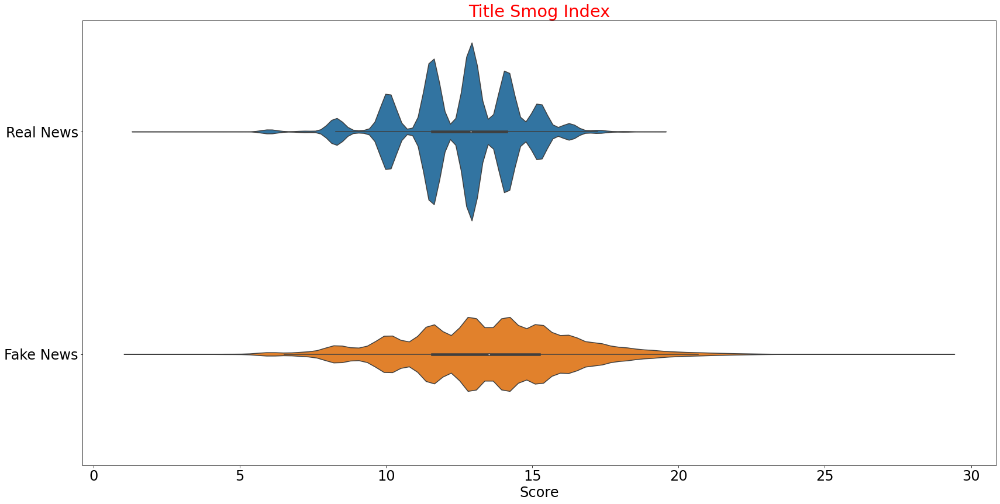

smog_title                                                      \
               count       mean       std      min        25%        50%   
Real_Fake                                                                  
0            21190.0  12.535979  1.959113  1.84499  11.573499  12.906639   
1            17387.0  13.452443  2.846472  1.84499  11.573499  13.524018   

                                 
                 75%        max  
Real_Fake                        
0          14.114418  19.036653  
1          15.226696  28.623255

In [32]:
ax = sns.violinplot(y = 'Real_Fake', x ='smog_title', data = data, orient = 'h')
plt.title('Title Smog Index', c ='red')
plt.xlabel('Score')
ax.set_yticklabels(['Real News','Fake News'])
plt.ylabel('')
plt.savefig('C:\\Users\\gianl\\Capstone2\\figures\\SMOG_title_7_23.tiff', dpi =120)
plt.show()

data.groupby('Real_Fake')[['smog_title']].describe()

# ARI_title

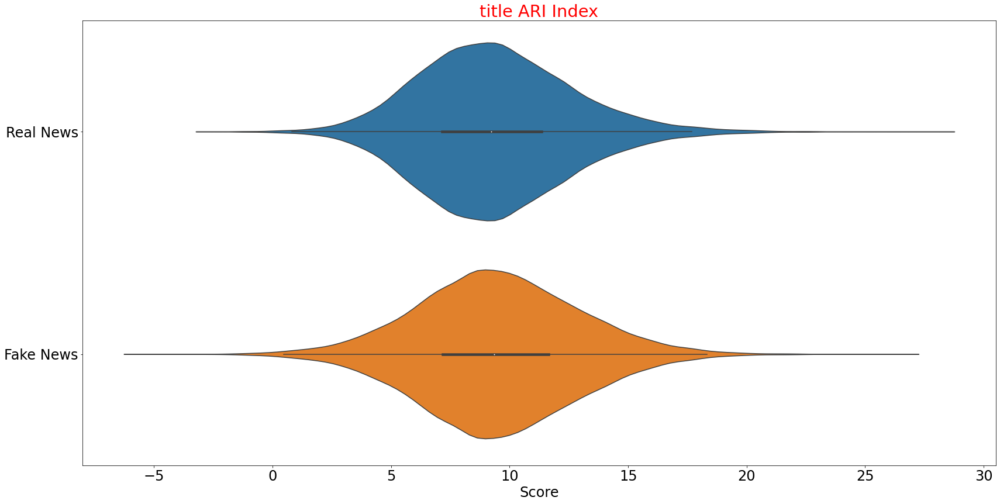

ARI_title                                                            \
              count      mean       std      min       25%       50%      75%   
Real_Fake                                                                       
0           21190.0  9.370008  3.222935 -2.35625  7.143333  9.236667  11.3590   
1           17387.0  9.488340  3.420805 -5.30000  7.181538  9.344615  11.6525   

                   
              max  
Real_Fake          
0          27.885  
1          26.286

In [33]:
ax = sns.violinplot(y = 'Real_Fake', x ='ARI_title', data = data, orient = 'h')
plt.title('title ARI Index', c ='red')
plt.xlabel('Score')
ax.set_yticklabels(['Real News','Fake News'])
plt.ylabel('')
plt.savefig('C:\\Users\\gianl\\Capstone2\\figures\\ARI_title_7_23.tiff', dpi =120)
plt.show()

data.groupby('Real_Fake')[['ARI_title']].describe()

In [34]:
# T test for the title  
ss.ttest_ind(data[data['Real_Fake'] == 0]['ARI_title'], data[data['Real_Fake'] == 1]['ARI_title'], equal_var = False)

Ttest_indResult(statistic=-3.4695054505487284, pvalue=0.0005220243234119508)

# CLI_text 

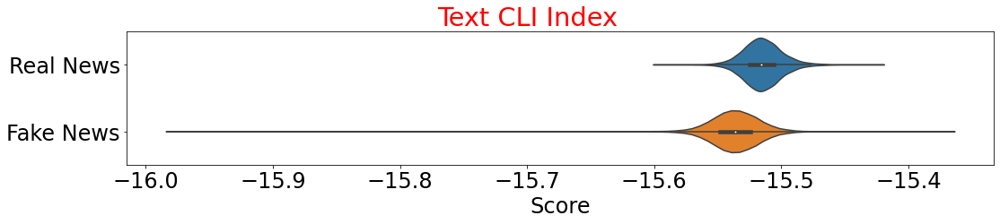

CLI_text                                                        \
             count       mean       std        min        25%        50%   
Real_Fake                                                                  
0          21190.0 -15.514878  0.015704 -15.596688 -15.524814 -15.515445   
1          17387.0 -15.536487  0.020483 -15.978400 -15.548037 -15.536272   

                                 
                 75%        max  
Real_Fake                        
0         -15.505583 -15.423416  
1         -15.524197 -15.369467

In [35]:
plt.figure(figsize =(16,4))
ax = sns.violinplot(y = 'Real_Fake', x ='CLI_text', data = data, orient = 'h')
plt.title('Text CLI Index        ', c ='red')
plt.xlabel('Score')
ax.set_yticklabels(['Real News','Fake News'])
plt.ylabel('')
plt.tight_layout()
plt.savefig('C:\\Users\\gianl\\Capstone2\\figures\\CLi_text_7_23.tiff', dpi = 120)
plt.show()

data.groupby('Real_Fake')[['CLI_text']].describe()

In [36]:
# T test for the text  
ss.ttest_ind(data[data['Real_Fake'] == 0]['CLI_text'], data[data['Real_Fake'] == 1]['CLI_text'], equal_var = False)

Ttest_indResult(statistic=114.25746595043869, pvalue=0.0)

# Gulpease index 

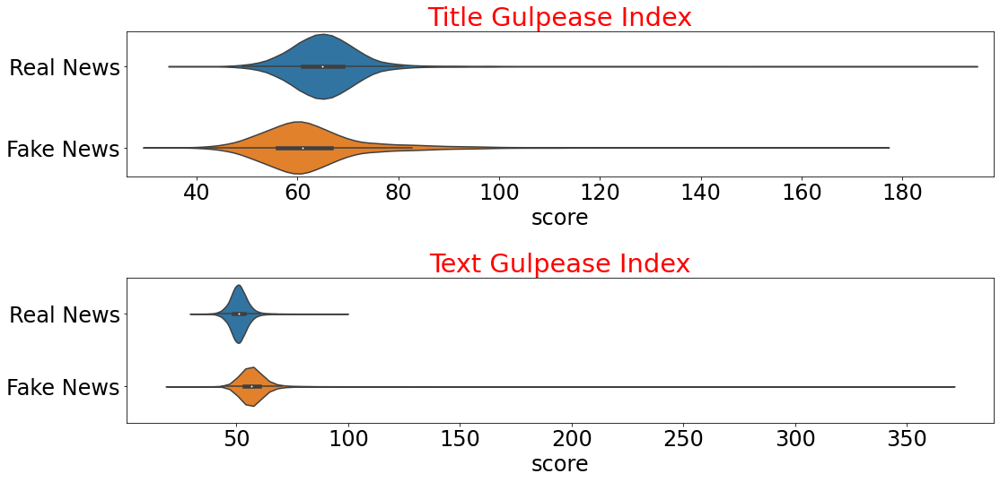

Gulpease_title                                               \
                   count       mean        std        min   25%   50%   
Real_Fake                                                               
0                21190.0  65.573917   7.750226  36.500000  61.0  65.0   
1                17387.0  62.963545  11.667802  32.684211  56.0  61.0   

                             Gulpease_text                                  \
                 75%     max         count       mean       std        min   
Real_Fake                                                                    
0          69.000000  192.75       21190.0  51.051709  4.398240  30.283019   
1          66.692308  174.00       17387.0  57.622233  8.744646  20.794872   

                                                        
                 25%        50%        75%         max  
Real_Fake                                               
0          48.527810  50.875000  53.315789   98.756098  
1          53.466763  56.706422  60.230876  369.000000

In [37]:
plt.figure(figsize =(16,8))
plt.subplot(2,1,1)
ax = sns.violinplot(x = 'Gulpease_title', y = 'Real_Fake', data = data, orient ='h')
ax.set_yticklabels(['Real News','Fake News'])
plt.title('Title Gulpease Index', c ='red' )
plt.xlabel('score')
plt.ylabel('')
plt.margins(0.02)
plt.subplot(2,1,2)
ax = sns.violinplot(x = 'Gulpease_text', y = 'Real_Fake', data = data, orient ='h')
ax.set_yticklabels(['Real News','Fake News'])
plt.title('Text Gulpease Index', c ='red' )
plt.xlabel('score')
plt.ylabel('')
plt.tight_layout()
plt.savefig('C:\\Users\\gianl\\Capstone2\\figures\\Gulpease_7_23.tiff',dpi =120)
plt.show()


data.groupby('Real_Fake')[['Gulpease_title', 'Gulpease_text']].describe()

In [38]:
# T test for the title  
ss.ttest_ind(data[data['Real_Fake'] == 0]['Gulpease_title'], data[data['Real_Fake'] == 1]['Gulpease_title'], equal_var = False)

Ttest_indResult(statistic=25.277394267167256, pvalue=1.811019292603741e-139)

In [39]:
# T test for the text  
ss.ttest_ind(data[data['Real_Fake'] == 0]['Gulpease_text'], data[data['Real_Fake'] == 1]['Gulpease_text'], equal_var = False)

Ttest_indResult(statistic=-90.15996438958976, pvalue=0.0)

In [40]:
#Real news with lowest Gulpease_title score 
data[(data['Gulpease_title']<36.7) & (data['Real_Fake'] == 0)]['title'].values

array([' trump considering representative barletta for transportation secretary: politico'],
      dtype=object)

In [41]:
#fake news with lowest Gulpease_title value
data[(data['Gulpease_title']<32.7) & (data['Real_Fake'] == 1)]['title'].values

array([" update: judge orders cancellation of redskins trademark registration – washington redskin's new stadium construction held hostage by petty obama administration"],
      dtype=object)

# Comparing Smog title Vs gulpease title 

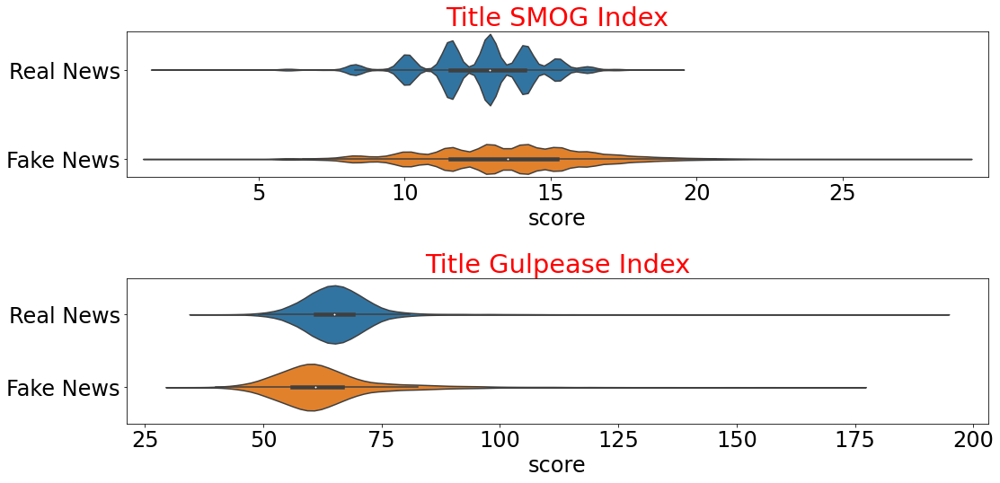

In [42]:
plt.figure(figsize =(16,8))
plt.subplot(2,1,1)
ax = sns.violinplot(x = 'smog_title', y = 'Real_Fake', data = data, orient ='h')
ax.set_yticklabels(['Real News', 'Fake News'])
plt.title('Title SMOG Index', c ='red' )
plt.ylabel('')
plt.xlabel('score')
plt.margins(0.02)
plt.subplot(2,1,2)
ax = sns.violinplot(x = 'Gulpease_title', y = 'Real_Fake', data = data, orient ='h')
ax.set_yticklabels(['Real News','Fake News'])
plt.title('Title Gulpease Index', c ='red' )
plt.ylabel('')
plt.xlabel('score')
plt.tight_layout()
plt.savefig('C:\\Users\\gianl\\Capstone2\\figures\\Smog_gulpease_title_swarm_7_29.tiff', dpi =120)
plt.show()

# Lemmatized words of the text

## 1- CountVectorizer

In [43]:
vectorizer = CountVectorizer(min_df=0)
vectorizer.fit(data['text_nlp_lem'])
x = vectorizer.transform(data['text_nlp_lem'])
x = x.toarray()
x.shape

(38577, 96378)

In [44]:
sum = np.sum(x, axis = 0)
sum.shape

(96378,)

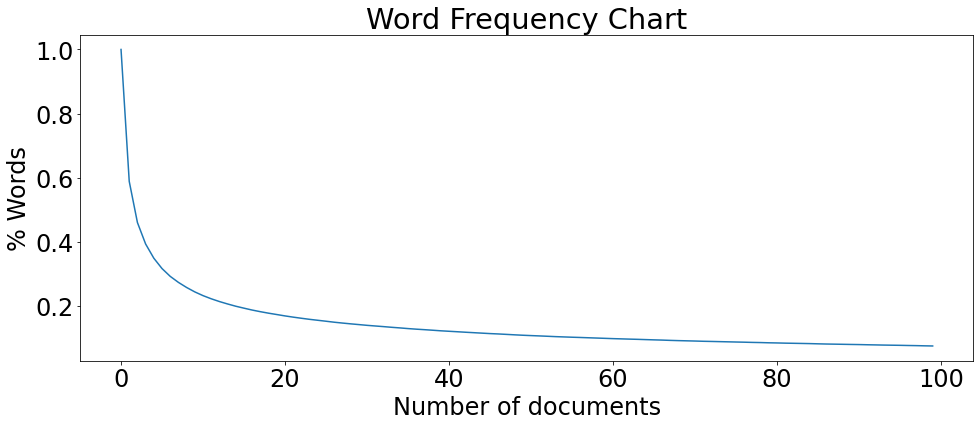

In [45]:
sum_col = []
for i in range (100):
    quanti = np.sum(sum > i) / len(sum)
    sum_col.append(quanti)


plt.figure(figsize= (16,6))
plt.plot(sum_col)
plt.ylabel('% Words')
plt.title('Word Frequency Chart')
plt.xlabel('Number of documents')
plt.savefig('C:\\Users\\gianl\\Capstone2\\figures\\words_count.tiff', dpi =120)
plt.show()

### Most common words in Real and Fake news

In [46]:
vectorizer2 = CountVectorizer(min_df=500)
vectorizer2.fit(data['text_nlp_lem'])
x2 = vectorizer2.transform(data['text_nlp_lem'])
x2 = x2.toarray()
print(x2.shape)


(38577, 2185)


In [47]:
Table = pd.DataFrame(x2, columns = vectorizer2.get_feature_names())
Table['Real_Fake'] = data['Real_Fake']

# total number of time that words appears 
Table_w = Table.groupby('Real_Fake').sum()

# number of news with that word
Table_con = Table > 0
Table_con = Table_con.groupby('Real_Fake').sum()
Table_con.index = ['0_conv', '1_conv']
# merging the two dataseta

Table_tot = Table_w.append(Table_con)


Table_tot = Table_tot.T
Table_tot['0_conv']= Table_tot['0_conv'] / 21190 *100
Table_tot['1_conv']= Table_tot['1_conv'] / 17387 *100

Table_tot.head()

,0,1,0_conv,1_conv
abandon,526.0,306.0,2.236904,1.524127
abc,327.0,941.0,1.198679,3.203543
ability,912.0,673.0,3.794243,3.353080
able,1644.0,2029.0,6.880604,9.869443
abo,507.0,828.0,2.260500,4.284810


In [48]:
Table_w_real = Table_tot.sort_values(0, ascending = False).iloc[:19, :]
Table_w_fake = Table_tot.sort_values(1, ascending = False).iloc[:19, :]

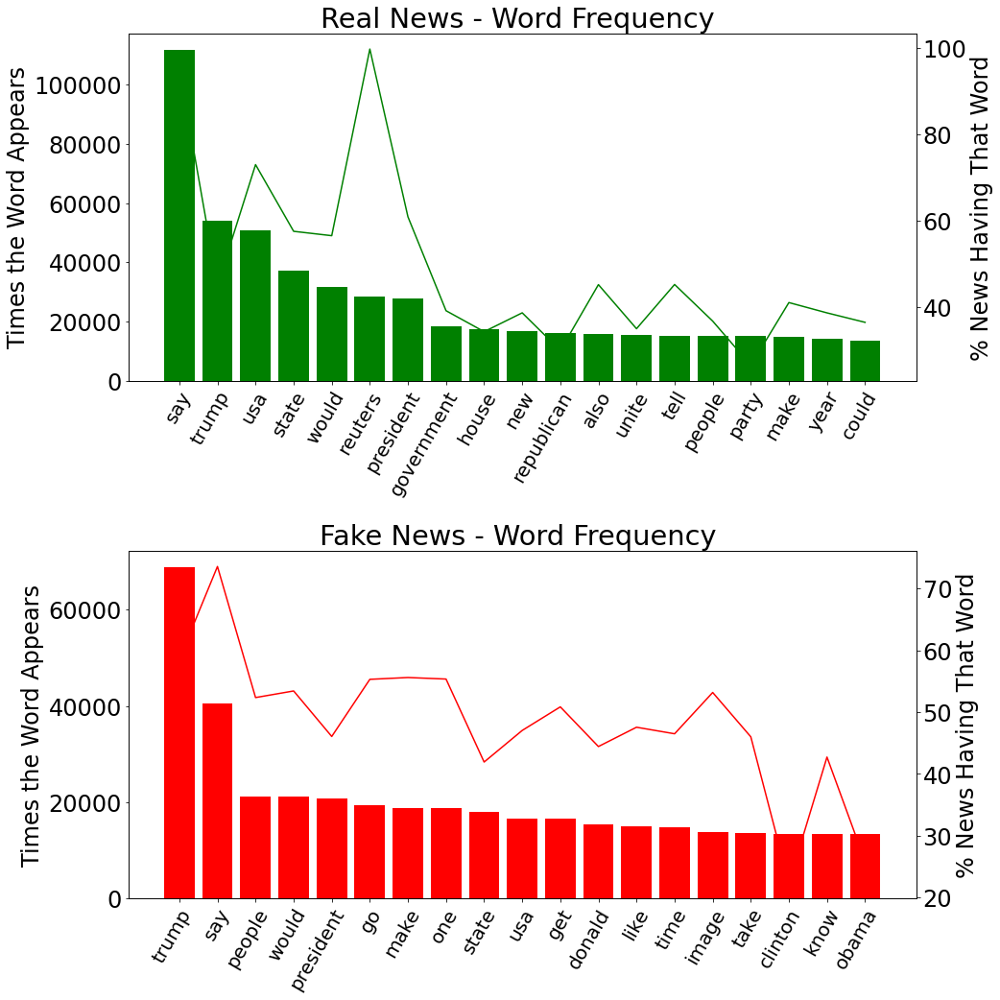

In [49]:
fig, (ax1, ax2)  = plt.subplots(2,1, figsize=(15,15))

ax1.bar(Table_w_real.index, Table_w_real.iloc[:,0], color = 'green')
ax1.set_xticklabels(Table_w_real.index, rotation = 60, ha = 'right', rotation_mode='anchor', fontsize = 20)
ax1.set_ylabel('Times the Word Appears')
ax1.set_title('Real News - Word Frequency ')

ax3 = ax1.twinx()
ax3.plot(Table_w_real.index, Table_w_real.iloc[:,2], color = 'green')
ax3.set_ylabel('% News Having That Word')


ax2.bar(Table_w_fake.index, Table_w_fake.iloc[:,1], color = 'red')
ax2.set_xticklabels(Table_w_fake.index, rotation = 60, ha = 'right', rotation_mode='anchor', fontsize = 20)
ax2.set_ylabel('Times the Word Appears')
ax2.set_title('Fake News - Word Frequency ')

ax4 = ax2.twinx()
ax4.plot(Table_w_fake.index, Table_w_fake.iloc[:,3], color = 'red')
ax4.set_ylabel('% News Having That Word')
plt.tight_layout()
plt.savefig('C:\\Users\\gianl\\Capstone2\\figures\\words_frequency.tiff', dpi =120)

In [50]:
# The word reuters appears in each real news. It will be excluded by training/testing of ML

# MODEL BUILDING CountVectorizer +  MultinomialNB

### Keep words appearing in 50 docs, max_df = 0.65 

In [51]:
stopW = ['facbooolink','bitlyylinkk','youtubelink','twitterlink', 'tmsnrtlinnk']

vectorizer = CountVectorizer(min_df = 50, max_df=0.65, stop_words = ['reuters'])
vectorizer.fit(data['text_nlp_lem'])
x_v_min_df = vectorizer.transform(data['text_nlp_lem'])
x_v_min_df = x_v_min_df.toarray()
x_v_min_df.shape

(38577, 9051)

In [52]:
y = data['Real_Fake']

x_train, x_test, y_train, y_test = train_test_split(x_v_min_df , y, test_size = 0.2, random_state = 42)

classif = MultinomialNB()
classif.fit(x_train, y_train)
y_pred = classif.predict(x_test)

print(confusion_matrix(y_test, y_pred))
print('Balanced accuracy is:', '{:.2f}'.format(balanced_accuracy_score(y_test, y_pred, adjusted =True)))

[[3910  301]
 [ 188 3317]]
Balanced accuracy is: 0.87


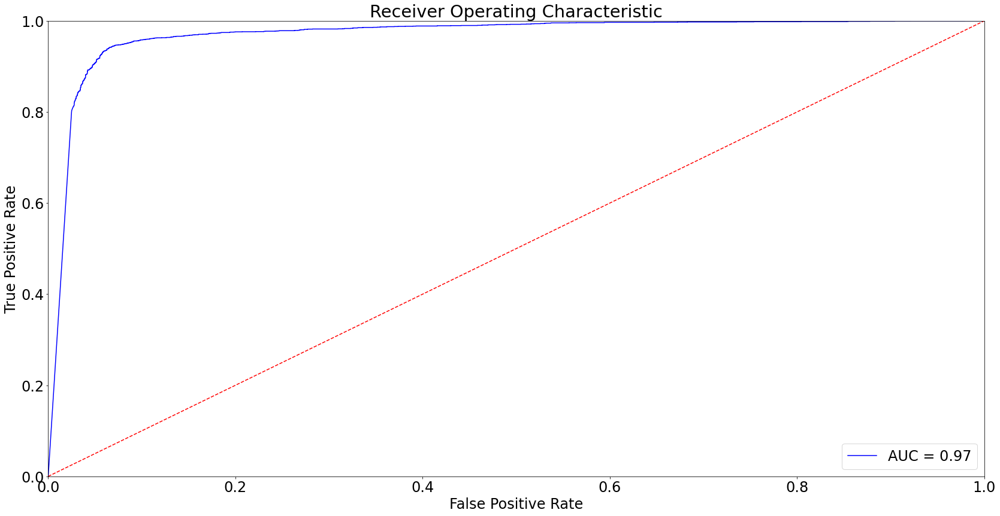

In [53]:
probs = classif.predict_proba(x_test)
preds = probs[:,1]
fpr, tpr, threshold = roc_curve(y_test, preds)
roc_auc = auc(fpr, tpr)

plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [54]:
#extrapolating relevant words
words = np.array(vectorizer.get_feature_names())
xxx = np.eye(x_v_min_df.shape[1])
probs = classif.predict_log_proba(xxx)[:,1]
list_word = np.argsort(probs)

In [55]:
best_for_real = words[list_word[:30]]
best_for_fake = words[list_word[-30:]]
good_prob = probs[list_word[:30]]
bad_prob = probs[list_word[-30:]]

for i,j in zip(good_prob, best_for_real):
    print('prob', '{:.3f}'.format(i), 'for the real-new-word: ', j )
print('-----------------------------------------')
print('-----------------------------------------')
for i,j in zip(bad_prob, best_for_fake):
    print('prob', '{:.3f}'.format(i),'for the fake-new-word: ', j )

prob -6.757 for the real-new-word:  rohingya
prob -6.652 for the real-new-word:  rakhine
prob -6.316 for the real-new-word:  puigdemont
prob -6.305 for the real-new-word:  zuma
prob -6.157 for the real-new-word:  myanmar
prob -6.117 for the real-new-word:  fdp
prob -6.048 for the real-new-word:  kyi
prob -6.039 for the real-new-word:  suu
prob -5.834 for the real-new-word:  mnangagwa
prob -5.759 for the real-new-word:  anc
prob -5.726 for the real-new-word:  odinga
prob -5.719 for the real-new-word:  rajoy
prob -5.685 for the real-new-word:  hariri
prob -5.681 for the real-new-word:  gulen
prob -5.585 for the real-new-word:  tmsnrtlinnk
prob -5.538 for the real-new-word:  aung
prob -5.534 for the real-new-word:  bitlyylinkk
prob -5.509 for the real-new-word:  barnier
prob -5.505 for the real-new-word:  barzani
prob -5.430 for the real-new-word:  harare
prob -5.389 for the real-new-word:  kurz
prob -5.305 for the real-new-word:  nairobi
prob -5.290 for the real-new-word:  marawi
prob -5

## Word Cloud

In [56]:
fake = best_for_fake.tolist()[::-1]
fake1 = ' '.join(fake)

cloudF = WordCloud(width = 2000, height = 1000, background_color = 'red', collocations = False).generate(fake1)


real = best_for_real.tolist()[::-1]
real = ' '.join(real)

cloudR = WordCloud(width = 2000, height = 1000, background_color = 'green', collocations = False).generate(real)


(-0.5, 1999.5, 999.5, -0.5)

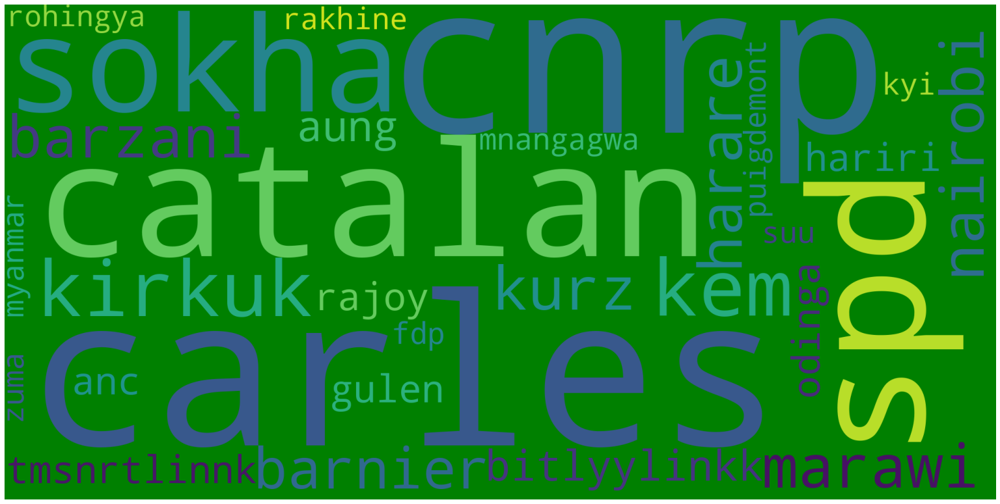

In [57]:
plt.imshow(cloudR)
plt.savefig('C:\\Users\\gianl\\Capstone2\\figures\\Real_word_cloud.tiff')
plt.axis('off')

(-0.5, 1999.5, 999.5, -0.5)

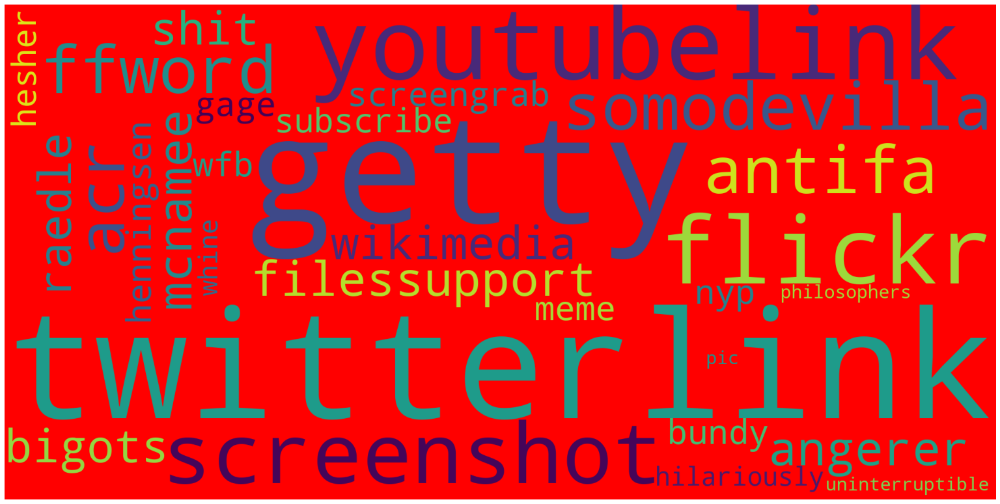

In [58]:
plt.imshow(cloudF)
plt.savefig('C:\\Users\\gianl\\Capstone2\\figures\\Fake_word_cloud.tiff')
plt.axis('off')

# Prediction made using linguistic indexes

In [59]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
y= data['Real_Fake']

### Without scaling 

In [63]:
LogistiReg_nonScaled = LogisticRegression(max_iter=2000)
params = {'C':[0.1, 1, 10]}
x_train_ns, x_test_ns, y_train_ns, y_test_ns = train_test_split(data_for_VIF, y, random_state = 42, test_size =0.2)
   
Grids= GridSearchCV(LogistiReg_nonScaled, params, cv = 4)
Grids.fit(x_train_ns,y_train_ns)
y_pred_non_scaled = Grids.predict(x_test_ns)
print('Balanced accuracy is ', balanced_accuracy_score(y_test_ns, y_pred_non_scaled, adjusted = True))
print('best C is', Grids.best_params_)

# calculate the AUC
probs = Grids.predict_proba(x_test_ns)
probs_1 = probs[:,1]

fpr, tpr, threshold = roc_curve(y_test_ns, probs_1)
auc_log = auc(fpr, tpr)
print('AUC is', round(auc_log, 4))

Balanced accuracy is  0.7423621511624163
best C is {'C': 0.1}
AUC is 0.9336


In [64]:
LogistiReg_nonScaled_c01 = LogisticRegression(C= 0.1, max_iter=2000)
LogistiReg_nonScaled_c01.fit(x_train_ns, y_train_ns)
prediction = LogistiReg_nonScaled_c01.predict(x_test_ns)

Results = pd.DataFrame({'coeff' : LogistiReg_nonScaled_c01.coef_.reshape(13).tolist()}, index = data_for_VIF.columns,)
scores_NoSCAL = Results.sort_values('coeff', ascending = False)
scores_NoSCAL

,coeff
CLI_text,1.814522
Count_words_title,0.920564
ARI_title,0.454369
Gulpease_text,0.160207
Gulpease_title,0.138578
Complex_words_title,0.072025
Complex_words_text,0.026842
Long_words_title,0.001391
smog_title,-0.003731
Flesh_Kin_Grade_title,-0.014357


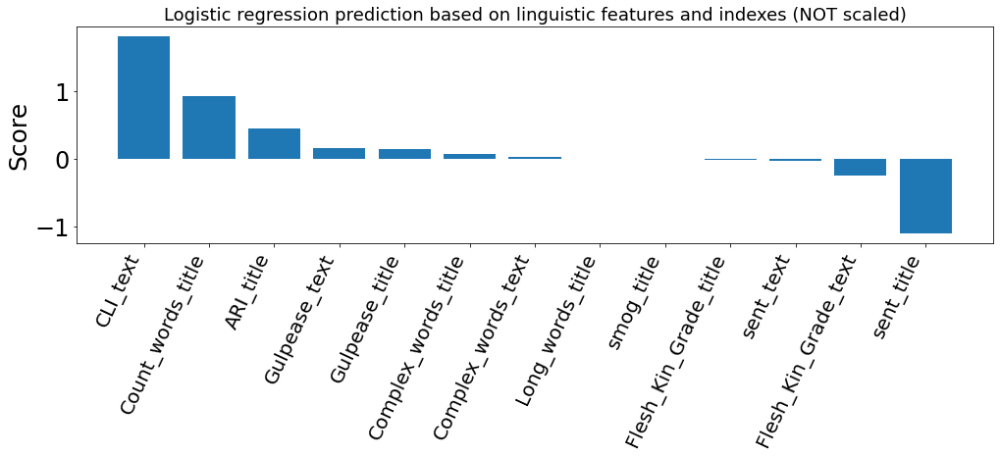

In [65]:
plt.figure(figsize =(15,7))
plt.bar(scores_NoSCAL.index, scores_NoSCAL.coeff)
plt.ylabel('Score', fontsize=25)
plt.title('Logistic regression prediction based on linguistic features and indexes (NOT scaled)', fontsize = 18)
plt.xticks(rotation = 65 ,fontsize = 20 , ha = 'right' )
plt.tight_layout()
plt.savefig('C:\\Users\\gianl\\Capstone2\\figures\\Linguistic_scores_prediction_unscaled.tiff', dpi=120);

### With scaling 

In [66]:
# Linguistic indexes are scaled
scale = StandardScaler()
data_for_VIF_scaled = scale.fit_transform(data_for_VIF)

In [67]:
Regr_sc3 = LogisticRegression(max_iter=2000)

x_train_s, x_test_s, y_train_s, y_test_s = train_test_split(data_for_VIF_scaled, y, random_state = 42, test_size =0.2)
params = {'C':[0.01, 0.1]}

grid_eg_sc = GridSearchCV(Regr_sc3, param_grid = params, cv = 4)
grid_eg_sc.fit(x_train_s, y_train_s)

print('Balanced accuracy is ', balanced_accuracy_score(y_test_s, grid_eg_sc.predict(x_test_s), adjusted = True))
print('best C is', grid_eg_sc.best_params_ )

Balanced accuracy is  0.7603347797409881
best C is {'C': 0.1}


In [68]:
#retrieving betas
Regr_sc3.fit(x_train_s, y_train_s)
print(pd.Series(Regr_sc3.coef_.reshape(13).tolist(), index = data_for_VIF.columns))

sent_title              -0.449634
Count_words_title        3.591787
Complex_words_title      0.053347
Long_words_title         0.073969
Flesh_Kin_Grade_title   -0.045040
smog_title               0.004258
ARI_title                1.686073
Gulpease_title           1.601193
sent_text               -0.516220
Complex_words_text       0.710771
Flesh_Kin_Grade_text    -0.934781
CLI_text                -0.919651
Gulpease_text            0.297456
dtype: float64


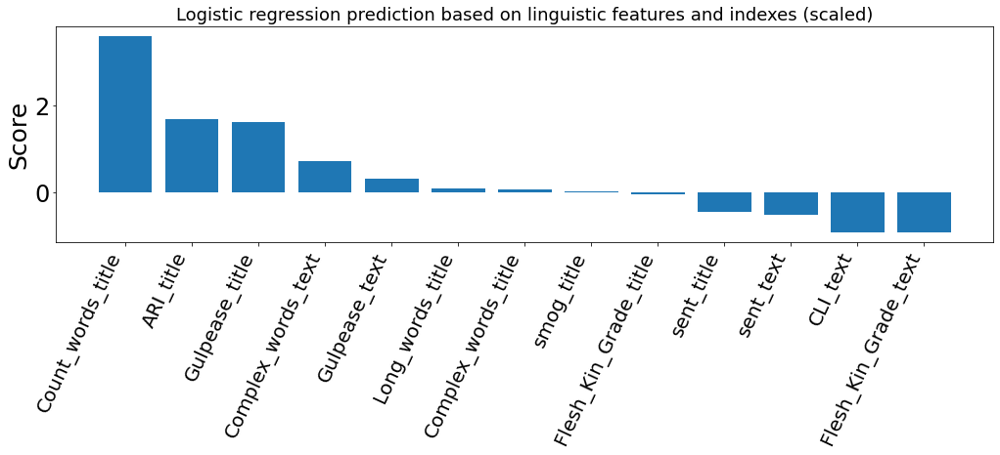

In [69]:
scores = pd.DataFrame(Regr_sc3.coef_.reshape(13).tolist(), index = data_for_VIF.columns, columns = ['Score'])
scores = scores.sort_values('Score', ascending = False)

plt.figure(figsize =(15,7))
plt.bar(scores.index, scores.Score)
plt.ylabel('Score', fontsize=25)
plt.title('Logistic regression prediction based on linguistic features and indexes (scaled)', fontsize = 18)
plt.xticks(rotation = 65 ,fontsize = 20, ha = 'right' )
plt.tight_layout()
plt.savefig('C:\\Users\\gianl\\Capstone2\\figures\\Linguistic_scores_prediction.tiff', dpi=120);

# Clustering

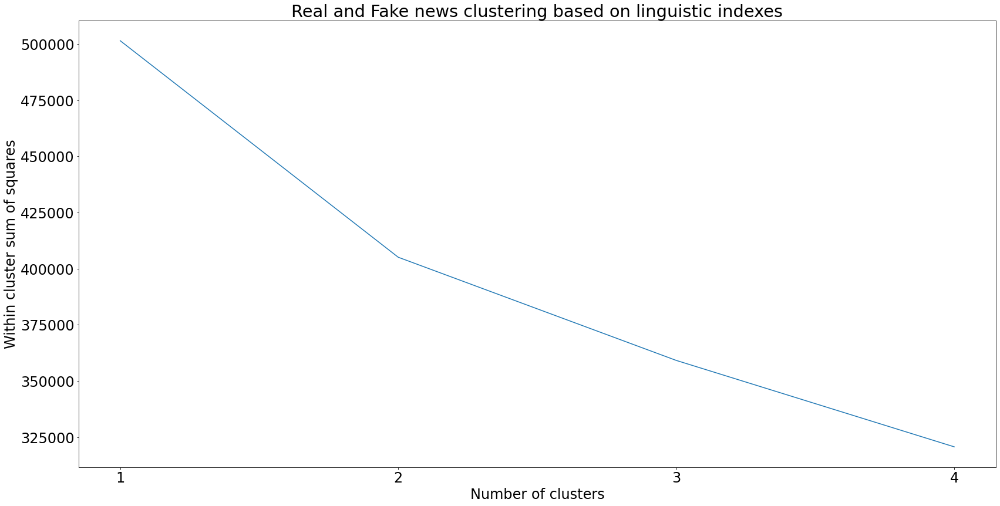

In [70]:
# I used KMEANS to determine if and how smoothly  the real and fake news cluster together
# I used the scaled linguistic index as imput features
from sklearn.cluster import KMeans

WCSS = []
for i in range (1, 5):
    mod = KMeans(n_clusters = i)
    mod.fit(data_for_VIF_scaled)
    WCSS.append(mod.inertia_)
    
plt.plot(np.arange(1,5), WCSS)
plt.xticks(np.arange(1,5))
plt.title('Real and Fake news clustering based on linguistic indexes')
plt.xlabel('Number of clusters')
plt.ylabel('Within cluster sum of squares')
plt.show();

plt.scatter(y = WCSS, x = [1,2,3,4], s = 1000)
plt.show();

# Principal component analysis

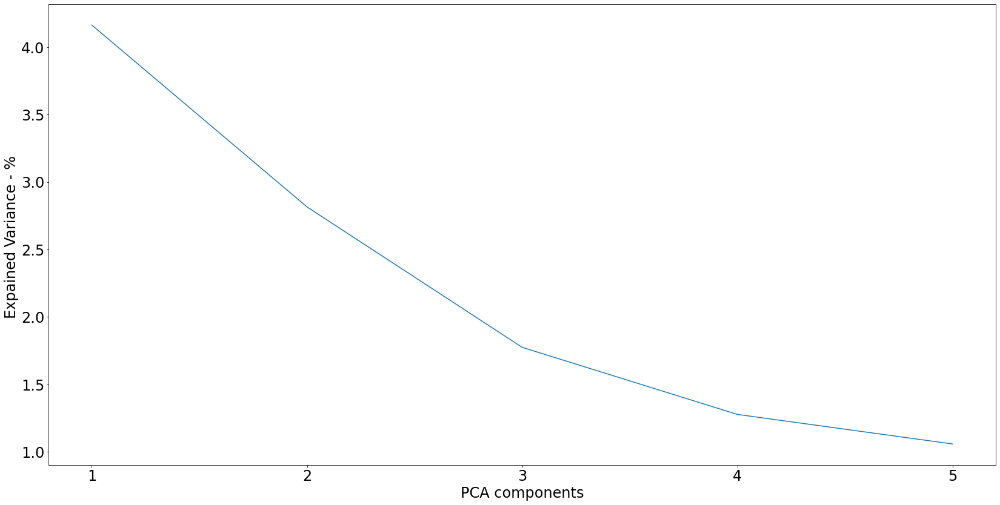

In [71]:
from sklearn.decomposition  import PCA
comp = PCA(n_components = 5)
comp.fit(data_for_VIF_scaled)

plt.plot([1,2,3,4,5], comp.explained_variance_)
plt.xlabel('PCA components')
plt.ylabel('Expained Variance - % ')
plt.xticks([1,2,3,4,5])
plt.show()

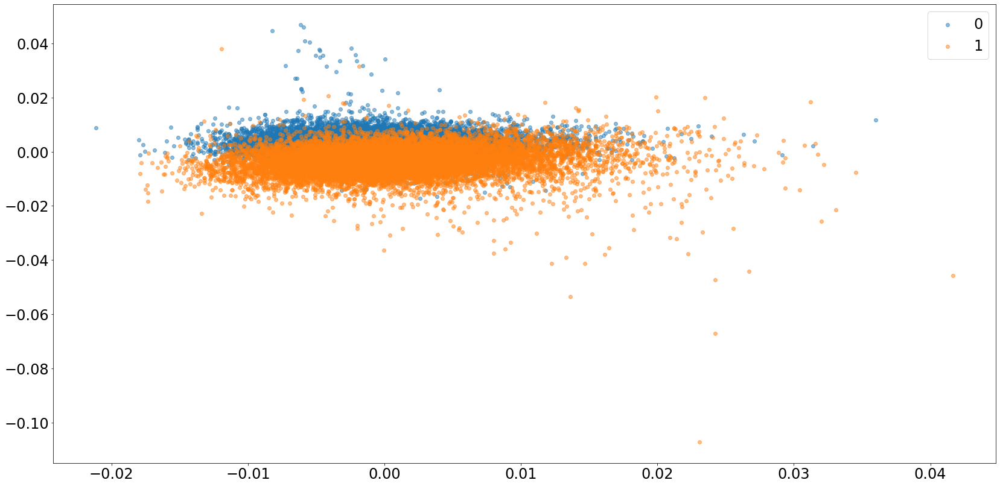

In [72]:
comp2 = PCA(n_components = 3)
comp2.fit(data_for_VIF_scaled.T)

cdict = {0: 'red', 1: 'blue'}

fig, ax = plt.subplots()
for g in np.unique(y):
    i = np.where(y == g)
    ax.scatter(comp2.components_[0][i], comp2.components_[1][i], label=g, alpha =0.5)

ax.legend()
plt.show();


## PCA -  3D plot of data using mplot3d

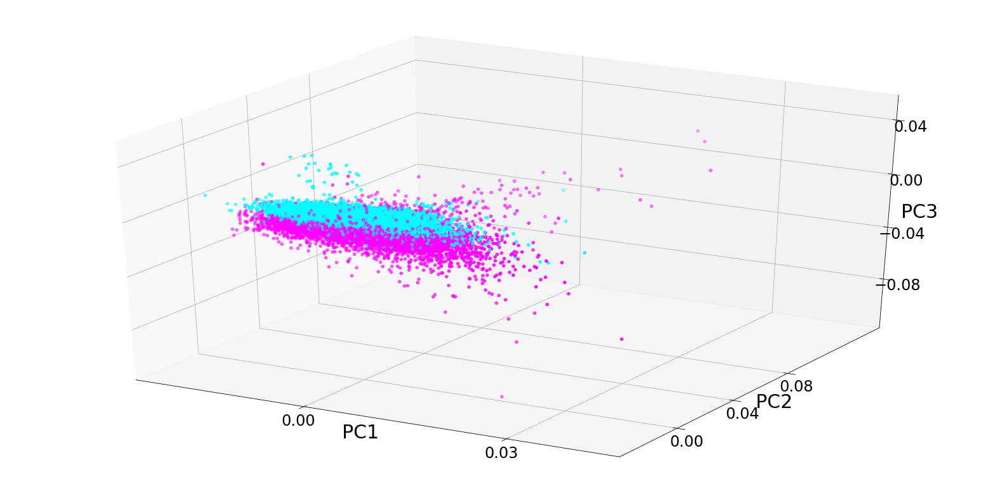

In [73]:
from mpl_toolkits import mplot3d

fig = plt.figure()
ax = plt.axes(projection='3d')
ax.scatter3D(comp2.components_[0], comp2.components_[2], comp2.components_[1], c=y, cmap = 'cool', label='News PCA')
ax.set_xticks([-0.03, 0, 0.03])
ax.set_yticks([-0.04, 0.00, 0.04, 0.08])
ax.set_zticks([-0.08, -0.04, 0.0, 0.04])
ax.set_xlabel('PC1', fontsize = 30)
ax.set_ylabel('PC2', fontsize = 30)
ax.set_zlabel('PC3', fontsize = 30)
plt.show()

## PCA - 3D plot of data using px

In [74]:
import plotly.express as px

PC_data = pd.DataFrame({'PC1' : comp2.components_[0], 'PC2' : comp2.components_[1], 'PC3' : comp2.components_[2]})
PC_data['label'] = data['Real_Fake']

fig = px.scatter_3d(PC_data, x='PC2', y='PC3', z='PC1', color='label')
fig.show()
